Training the network.

1) Installing Detectron2 and imports

2) Linking google drive

3) Registering datasets to Detectron

4) Training the Network

5) Evaluating with test data

# Install Detectron2

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
#!git clone 'https://github.com/facebookresearch/detectron2'
#dist = distutils.core.run_setup("./detectron2/setup.py")
#!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
#sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-cl7ovqcd
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-cl7ovqcd
  Resolved https://github.com/facebookresearch/detectron2.git to commit 38af375052d3ae7331141bc1a22cfa2713b02987
  Preparing metadata (setup.py) ... done


In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Tue_Mar__8_18:18:20_PST_2022
Cuda compilation tools, release 11.6, V11.6.124
Build cuda_11.6.r11.6/compiler.31057947_0
torch:  1.13 ; cuda:  cu116


In [3]:
#Initialization
#For Detectron2
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

#Imports
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

#Import useful Detectron2 functions
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

## Linking to google drive. Note that we require google-drive-ocamlfuse and authentication when using GCP.

In [4]:
##Only need to do this once for installation.
!sudo apt-get install google-drive-ocamlfuse
!sudo add-apt-repository ppa:alessandro-strada/ppa
!sudo apt-get update
!sudo apt-get install google-drive-ocamlfuse

Reading package lists... Done
Building dependency tree       
Reading state information... Done
google-drive-ocamlfuse is already the newest version (0.7.30-0ubuntu1~ubuntu20.04.1).
The following package was automatically installed and is no longer required:
  libnvidia-common-510
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 32 not upgraded.
 Mount Google Drive on Ubuntu (via FUSE)
 More info: https://launchpad.net/~alessandro-strada/+archive/ubuntu/ppa
Press [ENTER] to continue or Ctrl-c to cancel adding it.

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu2004/x86_64  Release
Get:5 http://security.ubuntu.com/ubuntu focal-security InRelease [114

In [5]:
##Not used during GCP mode
#from google.colab import drive
#drive.mount('/content/gdrive/')

In [6]:
#Authentication (follow instructions and copy code to access google drive)
!google-drive-ocamlfuse -headless -id=** Insert id here ** -secret= ** Insert secret here **

In [7]:
#Initializing google drive to a folder
if not os.path.exists("./acv/"):
  os.makedirs("./acv/", exist_ok=True)


In [8]:
!google-drive-ocamlfuse acv

fuse: mountpoint is not empty
fuse: if you are sure this is safe, use the 'nonempty' mount option


In [9]:
#Change director to personal folder within the drive
os.chdir('./acv/Colab Notebooks/AppliedCV/')

# Train on a custom dataset

## Prepare the dataset

In [10]:
root = './Dataset/SSDD/'
data_dir = root + 'Proc_data/'

## Register dataset with Detectron2

In [11]:
# Function that retrieves a standard dataset compatible with Detectron2
def get_dict(type):
  """ Returns a list[dict] containing information about the dataset """
  import pickle
  base_dir = data_dir + type + '/'
  with open(base_dir + "standardDict.pkl", "rb") as input_file:
    return pickle.load(input_file)
     

In [12]:
from detectron2.structures import BoxMode

pre = 'ssdd_'

# Register
for d in ["train", "test", "test_offshore", "test_inshore", "train/train", "train/val", "train/toy"]:
    DatasetCatalog.register(pre + d, lambda d=d: get_dict(d))
    MetadataCatalog.get(pre + d).set(thing_classes=["ship"])

In [13]:
# Instances of metadata
train_metadata = MetadataCatalog.get(pre + 'train')

In [14]:
print(type(train_metadata))
print(train_metadata)

<class 'detectron2.data.catalog.Metadata'>
Metadata(name='ssdd_train', thing_classes=['ship'])


In [15]:
dataset_dicts = get_dict("train/train")  # list[dict]

print(dataset_dicts[0].keys())
print(dataset_dicts[0]['file_name'])

# Filter out pics w/o annotations
dataset_dicts_anns = []
for i in dataset_dicts:
  if i['annotations'] != []:
    dataset_dicts_anns.append(i)

dict_keys(['file_name', 'height', 'width', 'image_id', 'annotations'])
./Dataset/SSDD/Processed_data/train/03_15_11.jpg


{'file_name': './Dataset/SSDD/Processed_data/train/07_5_23.jpg', 'height': 800, 'width': 800, 'image_id': '07_5_23', 'annotations': [{'bbox': [133, 450, 158, 478], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 0}]}


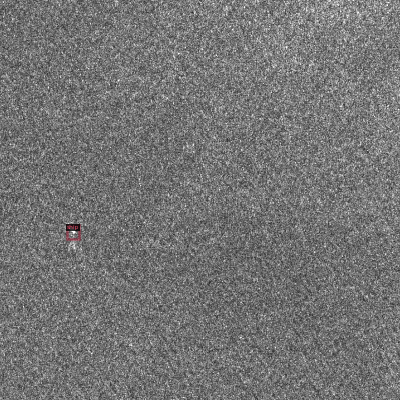

In [16]:
random.seed(1)
for d in random.sample(dataset_dicts_anns, 1):
    print(d)
    img = cv2.imread(d["file_name"])  # loads an image from a file and returns a numpy array of shape (H, W, C) 
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)  # 
    out = visualizer.draw_dataset_dict(d)  # drawing boxes
    cv2_imshow(out.get_image()[:, :, ::-1])  # get_image() returns a numpy array of shape (H, W, C) 

In [17]:
#Extracting metadata
train_metadata = MetadataCatalog.get('/train')
test_metadata = MetadataCatalog.get('/test')
train_metadata = MetadataCatalog.get('/train/train')
val_metadata = MetadataCatalog.get('/train/val')
toy_metadata = MetadataCatalog.get('/train/toy')
test_offshore = MetadataCatalog.get('/test_offshore')
test_inshore = MetadataCatalog.get('/test_inshore')

## Attempt training

In [18]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset, DatasetEvaluators
from detectron2.data import build_detection_test_loader
from detectron2.engine import DefaultTrainer

In [19]:
#Custom training with evaluation
class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        coco_evaluator = COCOEvaluator(dataset_name, output_dir='testing')
        
        evaluator_list = [coco_evaluator]
        
        return DatasetEvaluators(evaluator_list)


In [21]:
from detectron2.engine import DefaultTrainer
#Next: COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml
model_name = "./ModelOutput/faster_rcnn_X_101_32x8d_FPN_3x_r1"

#Model
cfg = get_cfg()
cfg.OUTPUT_DIR = model_name 
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")) 
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ship). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.5
cfg.MODEL.DEVICE = "cuda"

cfg.TEST.EVAL_PERIOD = 10000

#Dataset
cfg.DATASETS.TRAIN = ("ssdd_train/train",)
cfg.DATASETS.TEST = ("ssdd_train/val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False

cfg.INPUT.RANDOM_FLIP = "horizontal"
cfg.INPUT.MAX_SIZE_TRAIN = 800
cfg.INPUT.MIN_SIZE_TRAIN = 800
cfg.INPUT.MAX_SIZE_TEST = 800
cfg.INPUT.MIN_SIZE_TEST = 800

#Solver
cfg.SOLVER.MOMENTUM = 0.9
cfg.SOLVER.WEIGHT_DECAY = 0.0001
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025 # Default
cfg.SOLVER.MAX_ITER = 24000    # # 10 epochs * 4800 images / 2 images per batch = 24,000 iterations
cfg.SOLVER.STEPS = []        # do not decay learning rate


In [22]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
#trainer = DefaultTrainer(cfg) 
trainer = MyTrainer(cfg) 
trainer.resume_or_load(resume=True)


[02/28 00:28:47 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [23]:
trainer.train()

[02/28 00:29:08 d2.engine.train_loop]: Starting training from iteration 24000
[02/28 00:29:08 d2.engine.hooks]: Total training time: 0:00:00 (0:00:00 on hooks)
[02/28 00:29:08 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    ship    | 711          |
|            |              |
[02/28 00:29:08 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=800, sample_style='choice')]
[02/28 00:29:08 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[02/28 00:29:08 d2.data.common]: Serializing 1200 elements to byte tensors and concatenating them all ...
[02/28 00:29:08 d2.data.common]: Serialized dataset takes 0.19 MiB
[02/28 00:29:08 d2.evaluation.coco_evaluation]: Trying to convert 'ssdd_train/val' to COCO format ...
WARNING [02/28 00:29:08 d2.data.datasets.coco]: Using previously ca

/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/28 00:29:15 d2.evaluation.evaluator]: Inference done 11/1200. Dataloading: 0.1324 s/iter. Inference: 0.1212 s/iter. Eval: 0.0001 s/iter. Total: 0.2537 s/iter. ETA=0:05:01
[02/28 00:29:20 d2.evaluation.evaluator]: Inference done 26/1200. Dataloading: 0.1985 s/iter. Inference: 0.1214 s/iter. Eval: 0.0002 s/iter. Total: 0.3201 s/iter. ETA=0:06:15
[02/28 00:29:25 d2.evaluation.evaluator]: Inference done 41/1200. Dataloading: 0.2114 s/iter. Inference: 0.1209 s/iter. Eval: 0.0002 s/iter. Total: 0.3326 s/iter. ETA=0:06:25
[02/28 00:29:31 d2.evaluation.evaluator]: Inference done 58/1200. Dataloading: 0.2060 s/iter. Inference: 0.1210 s/iter. Eval: 0.0002 s/iter. Total: 0.3272 s/iter. ETA=0:06:13
[02/28 00:29:36 d2.evaluation.evaluator]: Inference done 74/1200. Dataloading: 0.2070 s/iter. Inference: 0.1208 s/iter. Eval: 0.0002 s/iter. Total: 0.3281 s/iter. ETA=0:06:09
[02/28 00:29:41 d2.evaluation.evaluator]: Inference done 91/1200. Dataloading: 0.2015 s/iter. Inference: 0.1208 s/iter. Eval:

In [24]:
# Look at training curves in tensorboard:
#%cd ModelOutput/
%load_ext tensorboard
%tensorboard --logdir ./ModelOutput/faster_rcnn_X_101_32x8d_FPN_3x_r1

Output hidden; open in https://colab.research.google.com to view.

## Evaluating test set

In [25]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[02/28 00:35:59 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./ModelOutput/faster_rcnn_X_101_32x8d_FPN_3x_r1/model_final.pth ...


In [26]:
#from detectron2.utils.visualizer import ColorMode

dataset_dicts = get_dict("test")   # must be "test", "test_offshore", "test_inshore"

# Filter out pics w/o annotations
dataset_dicts_anns = []
for i in dataset_dicts:
  if i['annotations'] != []:
    dataset_dicts_anns.append(i)

In [27]:
def printImage(ann, metadata, predictor = None, predFlag = False):
  #from detectron2.utils.visualizer import Visualizer

  im = cv2.imread(ann["file_name"])
  v = Visualizer(im[:, :, ::-1], 
                 metadata=metadata, 
                 scale=0.5)
  
  if predFlag:
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  else:
    out = v.draw_dataset_dict(ann)
  
  image = out.get_image()[:, :, ::-1]

  return image

In [28]:
os.makedirs(model_name + "/predImages", exist_ok=True)  # Make a directory for output images

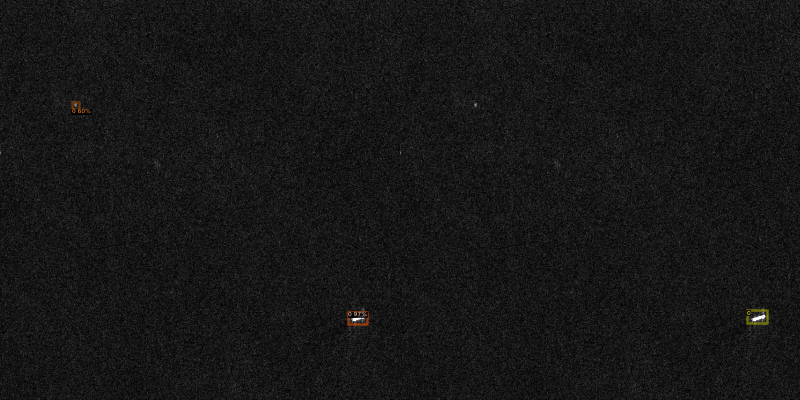

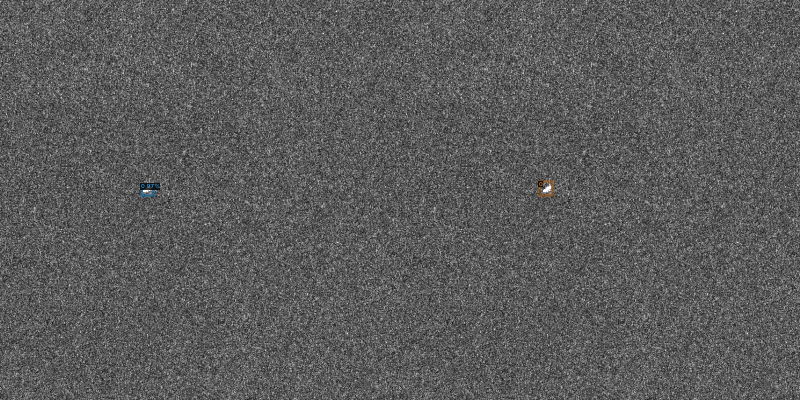

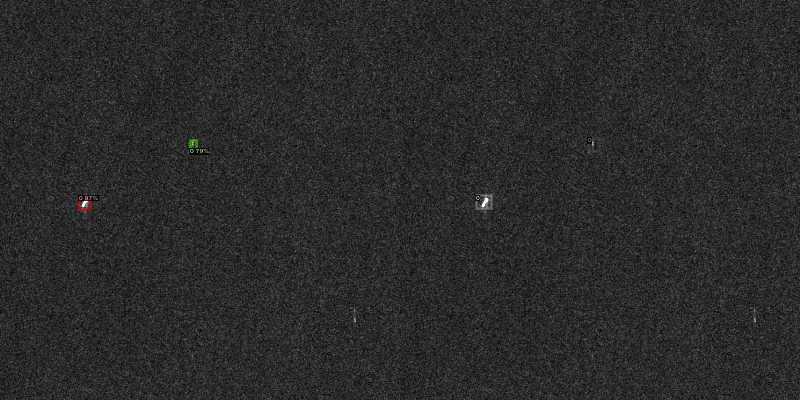

In [29]:
from cv2 import hconcat
#random.seed(2)

num_samples = 3

for d in random.sample(dataset_dicts_anns, num_samples):
  image1 = printImage(d, test_metadata, predictor, True)  # Prediction
  image2 = printImage(d, test_metadata, False)  # Ground truth
  image3 = hconcat([image1, image2])

  cv2_imshow(image3)  # display an image
  cv2.imwrite(model_name + '/predImages/' + str(d["image_id"] + '.jpg'), image3)  # save an image

In [30]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# test_offshore
evaluator = COCOEvaluator('ssdd_test', ('bbox',), False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, 'ssdd_test')

print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

SyntaxError: ignored